In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


## 范围选择

In [2]:
Longitude_Index = 54    #经度索引
Longitude_End = 62 +1   #经度索引

Latitude_Index = 17  # 纬度索引
Latitude_End = 31 +1 # 纬度索引

Sample2013 = np.load('./TECdata/IGS/IGS2013.npy')
Sample2014 = np.load('./TECdata/IGS/IGS2014.npy')
Sample2015 = np.load('./TECdata/IGS/IGS2015.npy')
Sample2017 = np.load('./TECdata/IGS/IGS2017.npy')
Sample2018 = np.load('./TECdata/IGS/IGS2018.npy')
Sample2019 = np.load('./TECdata/IGS/IGS2019.npy')

Sample2013.shape,Sample2014.shape,Sample2015.shape

Sample2017.shape,Sample2018.shape,Sample2019.shape

Target_region2013 = Sample2013[Latitude_Index:Latitude_End, Longitude_Index:Longitude_End,:12,:,:]
Target_region2014 = Sample2014[Latitude_Index:Latitude_End, Longitude_Index:Longitude_End,:12,:,:]
Target_region2015 = Sample2015[Latitude_Index:Latitude_End, Longitude_Index:Longitude_End,:12,:,:]

Target_region2017 = Sample2017[Latitude_Index:Latitude_End, Longitude_Index:Longitude_End,:12,:,:]
Target_region2018 = Sample2018[Latitude_Index:Latitude_End, Longitude_Index:Longitude_End,:12,:,:]
Target_region2019 = Sample2019[Latitude_Index:Latitude_End, Longitude_Index:Longitude_End,:12,:,:]

# 考虑13-14年拼接 15年头几天预测怎么算

high_activity = np.concatenate((Target_region2013,Target_region2014,Target_region2015), axis=-2)
low_activity = np.concatenate((Target_region2017,Target_region2018,Target_region2019), axis=-2)

MAX = np.max(high_activity)
print(MAX)

### 样本制作

###################绘图###################
import matplotlib.pyplot as plt

high_activity.shape, low_activity.shape

def swapdim(Target_region):
    data = np.swapaxes(Target_region, 0,2)
    data = np.swapaxes(data, 1,3)
    data = np.swapaxes(data, 0,1)
    return data
data_high = swapdim(high_activity)
data_low = swapdim(low_activity)

print(data_high.shape,data_low.shape)

# 测试归一化

# mm_high = data_high.reshape(-1,1)
# mm_low = data_low.reshape(-1,1)
# from sklearn.preprocessing import MinMaxScaler
# scaler_high = MinMaxScaler()
# scaler_low = MinMaxScaler()
# mm_high_scale = scaler_high.fit_transform(mm_high)
# mm_low_scale = scaler_low.fit_transform(mm_low)
# seq_high = mm_high_scale.reshape(-1,15,9,1)
# seq_low = mm_low_scale.reshape(-1,15,9,1)
# seq_high.shape,seq_low.shape

seq_high = data_high.reshape(-1,15,9,1)
seq_low = data_low.reshape(-1,15,9,1)
seq_high.shape,seq_low.shape

# 数据集划分
def create_dataset(data, look_back=12*7, forward=12 * 4):
    x = []
    y = []
    for i in range(0,data.shape[0]-(look_back+forward)+1,forward):
        x.append(data[i:i+look_back,:,:,:])
        y.append(data[i+look_back:i+look_back+forward,:,:,:])
    return (np.array(x), np.array(y))

train_high,test_high = create_dataset(seq_high)
train_low,test_low = create_dataset(seq_low)

train_high.shape,test_high.shape,train_low.shape,test_low.shape,

# 保证测试年完整性，即pot选在   -(365) 处 
pot_high = (92)
pot_low = (92)
train_X = np.concatenate((train_high[:-pot_high], train_low[:-pot_low]), axis=0)
train_Y = np.concatenate((test_high[:-pot_high], test_low[:-pot_low]), axis=0)

test_X_2015 = train_high[-pot_high:]
test_Y_2015 = test_high[-pot_high:]

test_X_2019 = train_low[-pot_low:]
test_Y_2019 = test_low[-pot_low:]

train_X.shape,test_X_2015.shape,test_X_2019.shape

test_Y_2019.shape

136.8


(92, 48, 15, 9, 1)

In [3]:
# train_X = np.load('./TECdata/数据集/Xtrain.npy')
# train_Y = np.load('./TECdata/数据集/Ytrain.npy')
# test_X_2015 = np.load('./TECdata/数据集/Xtest2015.npy')
# test_Y_2015 = np.load('./TECdata/数据集/Ytest2015.npy')
# test_X_2019 = np.load('./TECdata/数据集/Xtest2019.npy')
# test_Y_2019 = np.load('./TECdata/数据集/Ytest2019.npy')

In [4]:
train_X.shape

(360, 84, 15, 9, 1)

### LearningRateScheduler调整学习率

In [5]:
MAX = np.max(train_X)
MAX

136.8

In [6]:
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler,ModelCheckpoint
from tensorflow.keras import mixed_precision

In [7]:
def scheduler(epoch):
    if epoch % 50 ==0 and epoch != 0 :
        lr = K.get_value(tcn.optimizer.lr)
        if lr > 1e-5:
            K.set_value(tcn.optimizer.lr, lr *0.5)
            print('lr changed to {}'.format(lr * 0.5))
    return K.get_value(tcn.optimizer.lr)

In [8]:
reduce_lr = LearningRateScheduler(scheduler)
checkpoint_callback = './checkpoint/4day.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_callback,verbose=1,save_best_only=True)

In [9]:
import tensorflow as tf
from tensorflow.keras.layers import ConvLSTM2D,Conv2D,Conv3D,BatchNormalization,Flatten,RepeatVector,Reshape,Activation,Dot, Concatenate, TimeDistributed
from tensorflow.keras.utils import plot_model
from tensorflow.keras import Input, Model, Sequential
from tensorflow.keras.regularizers import L1
from sklearn.metrics import mean_squared_error

In [10]:
# 自定义损失函数
def RMSE(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
def MAPE(y_true, y_pred):
    return K.mean(K.abs((y_true-y_pred)/y_true))
# Loss function
def ssim_loss(y_true, y_pred):
    return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, MAX, filter_size=3))
def mix_loss(y_true,y_pred,MAE_loss_weight=0.6,MSE_loss_weight=0.6):
    MAE_loss = K.mean(K.abs(y_pred-y_true))
    MSE_loss = K.mean(K.square(y_pred-y_true))
    total_loss = MAE_loss * MAE_loss_weight + MSE_loss*MSE_loss_weight
    return total_loss
def MSE(y_true, y_pred):
    return K.mean(K.square(y_pred - y_true))

In [11]:
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)
# 另一种写法是只用下面这一行语句。但是为了验证 policy.compute_dtype，必须使用上面2行语句。
# tf.keras.mixed_precision.set_global_policy("mixed_float16")

# 上面设置好 global_policy 之后，可以用下面2行验证数据类型。
print(f'Compute dtype: {policy.compute_dtype}')
print(f'Variable dtype: {policy.variable_dtype}')
# 变量的数据类型保持为 float32，以保证数字的稳定性 numeric stability。

Your GPU may run slowly with dtype policy mixed_float16 because it does not have compute capability of at least 7.0. Your GPU:
  NVIDIA GeForce GTX 1070 Ti, compute capability 6.1
See https://developer.nvidia.com/cuda-gpus for a list of GPUs and their compute capabilities.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once
Compute dtype: float16
Variable dtype: float32


In [12]:
#输入维数
input_layer =Input(shape=(train_X.shape[1:]))
x = ConvLSTM2D(filters=8,kernel_size=(3,3),padding='same',use_bias=False,return_sequences=True)(input_layer)
x = BatchNormalization()(x)
x = ConvLSTM2D(filters=8,kernel_size=(3,3),padding='same',use_bias=False,return_sequences=True)(x)
x = BatchNormalization()(x)
# x = ConvLSTM2D(filters=16,kernel_size=(3,3),padding='same',use_bias=False,return_sequences=True)(x)
# x = BatchNormalization()(x)

encoder_stack_h,encoder_last_h,encoder_last_c = ConvLSTM2D(
    filters=8,kernel_size=(3,3),padding='same',use_bias=False,return_sequences=True, return_state=True)(x)
encoder_stack_h = Conv3D(8, (1,1,1), padding='same',use_bias=False)(encoder_stack_h)
encoder_last_h = BatchNormalization()(encoder_last_h)
encoder_last_c = BatchNormalization()(encoder_last_c)
print(encoder_stack_h)
# ###############################
context = Flatten()(encoder_last_h)
context = RepeatVector(48)(context)
context = Reshape((48, 15, 9, 8))(context)

x = ConvLSTM2D(filters=8,kernel_size=(3,3),padding='same',use_bias=False,return_sequences=True)(context)
x = BatchNormalization()(x)
# x = ConvLSTM2D(filters=16,kernel_size=(3,3),padding='same',use_bias=False,return_sequences=True)(x)
# x = BatchNormalization()(x)
decoder = ConvLSTM2D(filters=8,kernel_size=(3,3),padding='same',
                     use_bias=False,return_sequences=True, 
                     return_state=False)(x)
print(decoder)
decoder = Conv3D(8, (1,1,1), padding='same',use_bias=False)(decoder)
decoder = BatchNormalization()(decoder)
# Attention 
# decoder trans (B,N,C)
decoder = Reshape((48*15*9, -1))(decoder)
print('Reshape decoder=====',decoder)
encoder_stack_h = Reshape((84*15*9, -1))(encoder_stack_h)
print('Reshape encoder stack h====',encoder_stack_h)

attention = Dot(axes=[-1,-1])([decoder, encoder_stack_h])
print("attention====", attention)
attention = Activation('softmax')(attention)
print('Softmax Attention===',attention)
new_context = Dot(axes=[-1,-2])([attention, encoder_stack_h])
print('new_context====', new_context)
new_context = BatchNormalization()(new_context)

decoder_combined_context = Concatenate(axis=-1)([decoder, new_context])
print('decoder_combined_context====', decoder_combined_context)
out = Reshape((48, 15, 9,-1))(decoder_combined_context)
print('Out=======',out)
out = TimeDistributed(Conv2D(1,3,padding='same'))(out)
print('Out=======',out)
# out = Conv3D(filters=1, kernel_size=(3,3,3),activation="relu", padding="same")(decoder)
tcn = Model(inputs=input_layer, outputs=out)
opt_adam = tf.keras.optimizers.Adam(learning_rate=0.001)
opt_mixed_precision = mixed_precision.LossScaleOptimizer(opt_adam)
tcn.compile(opt_mixed_precision, loss=ssim_loss, metrics=[RMSE,MAPE,MSE])# RMSE
tcn.summary()
# plot_model(tcn,show_shapes=True,show_dtype=True,dpi=300)

KerasTensor(type_spec=TensorSpec(shape=(None, 84, 15, 9, 8), dtype=tf.float16, name=None), name='conv3d/Conv3D:0', description="created by layer 'conv3d'")
KerasTensor(type_spec=TensorSpec(shape=(None, 48, 15, 9, 8), dtype=tf.float16, name=None), name='conv_lst_m2d_4/transpose_1:0', description="created by layer 'conv_lst_m2d_4'")
Reshape decoder===== KerasTensor(type_spec=TensorSpec(shape=(None, 6480, 8), dtype=tf.float16, name=None), name='reshape_1/Reshape:0', description="created by layer 'reshape_1'")
Reshape encoder stack h==== KerasTensor(type_spec=TensorSpec(shape=(None, 11340, 8), dtype=tf.float16, name=None), name='reshape_2/Reshape:0', description="created by layer 'reshape_2'")
attention==== KerasTensor(type_spec=TensorSpec(shape=(None, 6480, 11340), dtype=tf.float16, name=None), name='dot/MatMul:0', description="created by layer 'dot'")
Softmax Attention=== KerasTensor(type_spec=TensorSpec(shape=(None, 6480, 11340), dtype=tf.float16, name=None), name='activation/Softmax:0'

In [13]:
test_X_2015.shape,test_Y_2015.shape

((92, 84, 15, 9, 1), (92, 48, 15, 9, 1))

In [14]:
history=tcn.fit(train_X,train_Y, 
        epochs=300, batch_size=5, validation_data=(test_X_2015,test_Y_2015),callbacks=[reduce_lr,model_checkpoint])


Epoch 1/300
72/72 [==============================] - 124s 2s/step - loss: 0.7066 - RMSE: 29.8566 - MAPE: 0.8590 - MSE: 921.9534 - val_loss: 0.8411 - val_RMSE: 32.0319 - val_MAPE: 0.9186 - val_MSE: 1102.9150

Epoch 00001: val_loss improved from inf to 0.84115, saving model to ./checkpoint\4day.h5
Epoch 2/300
72/72 [==============================] - 112s 2s/step - loss: 0.4871 - RMSE: 31.7604 - MAPE: 0.7118 - MSE: 1051.2822 - val_loss: 0.6147 - val_RMSE: 29.5296 - val_MAPE: 0.7559 - val_MSE: 947.2623

Epoch 00002: val_loss improved from 0.84115 to 0.61465, saving model to ./checkpoint\4day.h5
Epoch 3/300
72/72 [==============================] - 112s 2s/step - loss: 0.3791 - RMSE: 34.3385 - MAPE: 0.6484 - MSE: 1217.7554 - val_loss: 0.4818 - val_RMSE: 27.0816 - val_MAPE: 0.6098 - val_MSE: 809.4820

Epoch 00003: val_loss improved from 0.61465 to 0.48177, saving model to ./checkpoint\4day.h5
Epoch 4/300
72/72 [==============================] - 112s 2s/step - loss: 0.3281 - RMSE: 34.4776 - MA


Epoch 00029: val_loss did not improve from 0.08179
Epoch 30/300
72/72 [==============================] - 111s 2s/step - loss: 0.0807 - RMSE: 7.6921 - MAPE: 0.2316 - MSE: 69.6817 - val_loss: 0.0968 - val_RMSE: 6.2678 - val_MAPE: 0.1877 - val_MSE: 41.8033

Epoch 00030: val_loss did not improve from 0.08179
Epoch 31/300
72/72 [==============================] - 113s 2s/step - loss: 0.0759 - RMSE: 7.1790 - MAPE: 0.2139 - MSE: 59.7560 - val_loss: 0.0851 - val_RMSE: 5.9461 - val_MAPE: 0.1731 - val_MSE: 38.2357

Epoch 00031: val_loss did not improve from 0.08179
Epoch 32/300
72/72 [==============================] - 112s 2s/step - loss: 0.0684 - RMSE: 6.5088 - MAPE: 0.1912 - MSE: 47.6091 - val_loss: 0.0837 - val_RMSE: 6.0736 - val_MAPE: 0.1690 - val_MSE: 39.9256

Epoch 00032: val_loss did not improve from 0.08179
Epoch 33/300
72/72 [==============================] - 113s 2s/step - loss: 0.0814 - RMSE: 7.5652 - MAPE: 0.2335 - MSE: 68.6401 - val_loss: 0.0818 - val_RMSE: 5.7715 - val_MAPE: 0.1668

72/72 [==============================] - 112s 2s/step - loss: 0.0624 - RMSE: 5.9931 - MAPE: 0.1771 - MSE: 40.9620 - val_loss: 0.0775 - val_RMSE: 5.6793 - val_MAPE: 0.1599 - val_MSE: 34.8373

Epoch 00061: val_loss did not improve from 0.07557
Epoch 62/300
72/72 [==============================] - 112s 2s/step - loss: 0.0636 - RMSE: 6.0597 - MAPE: 0.1819 - MSE: 43.3191 - val_loss: 0.0776 - val_RMSE: 5.7322 - val_MAPE: 0.1599 - val_MSE: 35.5929

Epoch 00062: val_loss did not improve from 0.07557
Epoch 63/300
72/72 [==============================] - 112s 2s/step - loss: 0.0614 - RMSE: 5.9367 - MAPE: 0.1746 - MSE: 40.2239 - val_loss: 0.0787 - val_RMSE: 5.8050 - val_MAPE: 0.1586 - val_MSE: 37.0910

Epoch 00063: val_loss did not improve from 0.07557
Epoch 64/300
72/72 [==============================] - 112s 2s/step - loss: 0.0610 - RMSE: 5.7699 - MAPE: 0.1671 - MSE: 38.4517 - val_loss: 0.0794 - val_RMSE: 5.6448 - val_MAPE: 0.1607 - val_MSE: 33.9804

Epoch 00064: val_loss did not improve from 0


Epoch 00092: val_loss did not improve from 0.07408
Epoch 93/300
72/72 [==============================] - 112s 2s/step - loss: 0.0580 - RMSE: 5.4788 - MAPE: 0.1608 - MSE: 36.0239 - val_loss: 0.0755 - val_RMSE: 5.7707 - val_MAPE: 0.1553 - val_MSE: 36.7756

Epoch 00093: val_loss did not improve from 0.07408
Epoch 94/300
72/72 [==============================] - 112s 2s/step - loss: 0.0586 - RMSE: 5.5215 - MAPE: 0.1628 - MSE: 37.9307 - val_loss: 0.0795 - val_RMSE: 5.5851 - val_MAPE: 0.1602 - val_MSE: 33.2221

Epoch 00094: val_loss did not improve from 0.07408
Epoch 95/300
72/72 [==============================] - 112s 2s/step - loss: 0.0577 - RMSE: 5.3571 - MAPE: 0.1607 - MSE: 33.1700 - val_loss: 0.0790 - val_RMSE: 5.7335 - val_MAPE: 0.1617 - val_MSE: 35.1483

Epoch 00095: val_loss did not improve from 0.07408
Epoch 96/300
72/72 [==============================] - 114s 2s/step - loss: 0.0570 - RMSE: 5.4187 - MAPE: 0.1590 - MSE: 35.5897 - val_loss: 0.0845 - val_RMSE: 5.7741 - val_MAPE: 0.1634

72/72 [==============================] - 112s 2s/step - loss: 0.0526 - RMSE: 4.8632 - MAPE: 0.1478 - MSE: 26.3450 - val_loss: 0.0734 - val_RMSE: 5.4600 - val_MAPE: 0.1526 - val_MSE: 32.3066

Epoch 00124: val_loss did not improve from 0.07097
Epoch 125/300
72/72 [==============================] - 111s 2s/step - loss: 0.0545 - RMSE: 5.2427 - MAPE: 0.1539 - MSE: 31.9064 - val_loss: 0.0721 - val_RMSE: 5.5782 - val_MAPE: 0.1521 - val_MSE: 34.1841

Epoch 00125: val_loss did not improve from 0.07097
Epoch 126/300
72/72 [==============================] - 112s 2s/step - loss: 0.0524 - RMSE: 4.8748 - MAPE: 0.1464 - MSE: 26.8760 - val_loss: 0.0719 - val_RMSE: 5.5019 - val_MAPE: 0.1508 - val_MSE: 32.8002

Epoch 00126: val_loss did not improve from 0.07097
Epoch 127/300
72/72 [==============================] - 112s 2s/step - loss: 0.0529 - RMSE: 5.0144 - MAPE: 0.1485 - MSE: 28.6974 - val_loss: 0.0731 - val_RMSE: 5.5628 - val_MAPE: 0.1524 - val_MSE: 33.6367

Epoch 00127: val_loss did not improve fro


Epoch 00155: val_loss did not improve from 0.07035
Epoch 156/300
72/72 [==============================] - 111s 2s/step - loss: 0.0520 - RMSE: 4.8669 - MAPE: 0.1483 - MSE: 28.8244 - val_loss: 0.0715 - val_RMSE: 5.4073 - val_MAPE: 0.1503 - val_MSE: 31.5495

Epoch 00156: val_loss did not improve from 0.07035
Epoch 157/300
72/72 [==============================] - 112s 2s/step - loss: 0.0525 - RMSE: 4.9961 - MAPE: 0.1508 - MSE: 29.4857 - val_loss: 0.0713 - val_RMSE: 5.4461 - val_MAPE: 0.1505 - val_MSE: 32.1702

Epoch 00157: val_loss did not improve from 0.07035
Epoch 158/300
72/72 [==============================] - 112s 2s/step - loss: 0.0514 - RMSE: 4.8162 - MAPE: 0.1458 - MSE: 27.2888 - val_loss: 0.0702 - val_RMSE: 5.3922 - val_MAPE: 0.1491 - val_MSE: 31.5207

Epoch 00158: val_loss improved from 0.07035 to 0.07017, saving model to ./checkpoint\4day.h5
Epoch 159/300
72/72 [==============================] - 111s 2s/step - loss: 0.0517 - RMSE: 4.8919 - MAPE: 0.1486 - MSE: 27.2753 - val_loss

72/72 [==============================] - 112s 2s/step - loss: 0.0504 - RMSE: 4.7636 - MAPE: 0.1452 - MSE: 27.7699 - val_loss: 0.0714 - val_RMSE: 5.4048 - val_MAPE: 0.1498 - val_MSE: 31.4883

Epoch 00219: val_loss did not improve from 0.07010
Epoch 220/300
72/72 [==============================] - 112s 2s/step - loss: 0.0509 - RMSE: 4.8686 - MAPE: 0.1466 - MSE: 27.7597 - val_loss: 0.0725 - val_RMSE: 5.4095 - val_MAPE: 0.1506 - val_MSE: 31.3857

Epoch 00220: val_loss did not improve from 0.07010
Epoch 221/300
72/72 [==============================] - 112s 2s/step - loss: 0.0498 - RMSE: 4.7398 - MAPE: 0.1419 - MSE: 25.6597 - val_loss: 0.0713 - val_RMSE: 5.3895 - val_MAPE: 0.1498 - val_MSE: 31.3050

Epoch 00221: val_loss did not improve from 0.07010
Epoch 222/300
72/72 [==============================] - 112s 2s/step - loss: 0.0494 - RMSE: 4.6737 - MAPE: 0.1414 - MSE: 24.4116 - val_loss: 0.0703 - val_RMSE: 5.4426 - val_MAPE: 0.1489 - val_MSE: 32.2313

Epoch 00222: val_loss did not improve fro


Epoch 00250: val_loss improved from 0.06975 to 0.06963, saving model to ./checkpoint\4day.h5
Epoch 251/300
lr changed to 3.125000148429535e-05
72/72 [==============================] - 113s 2s/step - loss: 0.0490 - RMSE: 4.6052 - MAPE: 0.1393 - MSE: 24.2195 - val_loss: 0.0698 - val_RMSE: 5.3890 - val_MAPE: 0.1486 - val_MSE: 31.4376

Epoch 00251: val_loss did not improve from 0.06963
Epoch 252/300
72/72 [==============================] - 112s 2s/step - loss: 0.0490 - RMSE: 4.6435 - MAPE: 0.1407 - MSE: 24.5816 - val_loss: 0.0702 - val_RMSE: 5.3919 - val_MAPE: 0.1484 - val_MSE: 31.4411

Epoch 00252: val_loss did not improve from 0.06963
Epoch 253/300
72/72 [==============================] - 111s 2s/step - loss: 0.0498 - RMSE: 4.7345 - MAPE: 0.1435 - MSE: 26.3476 - val_loss: 0.0704 - val_RMSE: 5.4174 - val_MAPE: 0.1482 - val_MSE: 31.8200

Epoch 00253: val_loss did not improve from 0.06963
Epoch 254/300
72/72 [==============================] - 112s 2s/step - loss: 0.0494 - RMSE: 4.6834 - MA


Epoch 00283: val_loss did not improve from 0.06963
Epoch 284/300
72/72 [==============================] - 113s 2s/step - loss: 0.0494 - RMSE: 4.7084 - MAPE: 0.1424 - MSE: 25.6801 - val_loss: 0.0698 - val_RMSE: 5.4408 - val_MAPE: 0.1483 - val_MSE: 32.2500

Epoch 00284: val_loss did not improve from 0.06963
Epoch 285/300
72/72 [==============================] - 113s 2s/step - loss: 0.0491 - RMSE: 4.7096 - MAPE: 0.1405 - MSE: 25.6366 - val_loss: 0.0707 - val_RMSE: 5.4121 - val_MAPE: 0.1483 - val_MSE: 31.6869

Epoch 00285: val_loss did not improve from 0.06963
Epoch 286/300
72/72 [==============================] - 112s 2s/step - loss: 0.0493 - RMSE: 4.6835 - MAPE: 0.1422 - MSE: 25.4593 - val_loss: 0.0700 - val_RMSE: 5.4199 - val_MAPE: 0.1483 - val_MSE: 31.9472

Epoch 00286: val_loss did not improve from 0.06963
Epoch 287/300
72/72 [==============================] - 112s 2s/step - loss: 0.0499 - RMSE: 4.7294 - MAPE: 0.1434 - MSE: 26.5048 - val_loss: 0.0704 - val_RMSE: 5.4003 - val_MAPE: 0.

In [15]:
 history.history.keys() #查看history中存储了哪些参数

dict_keys(['loss', 'RMSE', 'MAPE', 'MSE', 'val_loss', 'val_RMSE', 'val_MAPE', 'val_MSE', 'lr'])

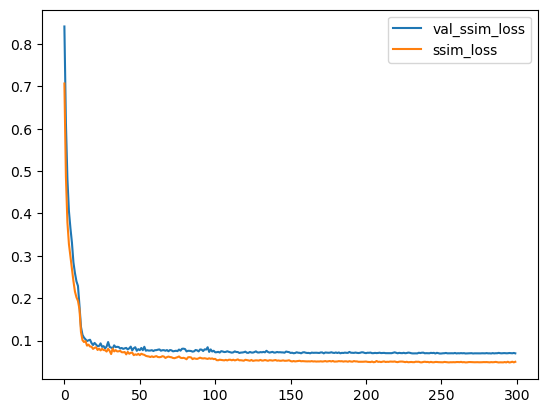

In [16]:
plt.plot(history.epoch,history.history.get('val_loss')[:]) #画出随着epoch增大loss的变化图
plt.plot(history.epoch,history.history.get('loss')[:])#画出随着epoch增大准确率的变化图
plt.legend(['val_ssim_loss','ssim_loss'])

In [ ]:
# tcn.save('../TrainedModel/att-convlstm.h5')

-------------------
### Load模型

In [167]:
from tensorflow.keras.models import load_model
tcn = load_model('./TrainedModel/att-convlstm.h5',
                 custom_objects={
                     'ssim_loss':ssim_loss,
                     'RMSE':RMSE,'MAPE':MAPE,'MSE':MSE})
tcn.compile(opt_mixed_precision, loss=ssim_loss, metrics=[RMSE,MAPE,MSE])# RMSE

In [17]:
test_Y_2015.shape

(92, 48, 15, 9, 1)

In [18]:
tcn.evaluate(test_X_2015, test_Y_2015,batch_size=10)
tcn.evaluate(test_X_2019, test_Y_2019,batch_size=10)

10/10 [==============================] - 5s 471ms/step - loss: 0.0241 - RMSE: 1.8517 - MAPE: 0.1202 - MSE: 3.5553


[0.024116722866892815,
 1.8516849279403687,
 0.12020459026098251,
 3.555288314819336]

In [19]:
predict_2015 = tcn.predict(test_X_2015,batch_size=10)
predict_2019 = tcn.predict(test_X_2019,batch_size=10)

In [20]:
predict_2015.shape

(92, 48, 15, 9, 1)

In [21]:
np.save("./TECdata/AttConvLSTM/4Dayatt_conv15.npy", predict_2015)
np.save("./TECdata/AttConvLSTM/4Dayatt_conv19.npy", predict_2019)

 0h : 0     2h  : 1     4h  : 2      6h  : 3
 8h : 4     10h : 5     12h : 6      14h : 7
16h : 8     18h : 9     20h : 10     22h : 11

### 可视化

In [116]:
print_layer_trainable(tcn)

True:	input_1
True:	conv_lst_m2d
True:	batch_normalization
True:	conv_lst_m2d_1
True:	batch_normalization_1
True:	conv_lst_m2d_2
True:	batch_normalization_2
True:	flatten
True:	repeat_vector
True:	reshape
True:	conv_lst_m2d_3
True:	batch_normalization_4
True:	conv_lst_m2d_4
True:	batch_normalization_5
True:	reshape_1
True:	reshape_2
True:	dot
True:	activation
True:	dot_1
True:	batch_normalization_6
True:	concatenate
True:	reshape_3
True:	time_distributed


In [156]:
Dot1 = Model(inputs=tcn.input,outputs=tcn.get_layer("batch_normalization_6").output)

In [157]:
result = Dot1.predict(x=test_X_2015[99:100])[0]

In [158]:
result.shape

(1620, 16)

In [159]:
result_mean = np.mean(result, axis=-1)
# result_new = np.sum(result, axis=-1)

In [160]:
result_mean.shape

(1620,)

In [161]:
index_x = np.arange(0,12*15*9+1,15*9)
index_y = np.arange(0,7*12*15*9+1,15*9)
# result_reshape = result[0,0*15*9:12*15*9,0*15*9:12*15*9]

In [162]:
r = result.reshape(-1,15,9).astype(np.float64)

In [163]:
r[0].shape

(15, 9)

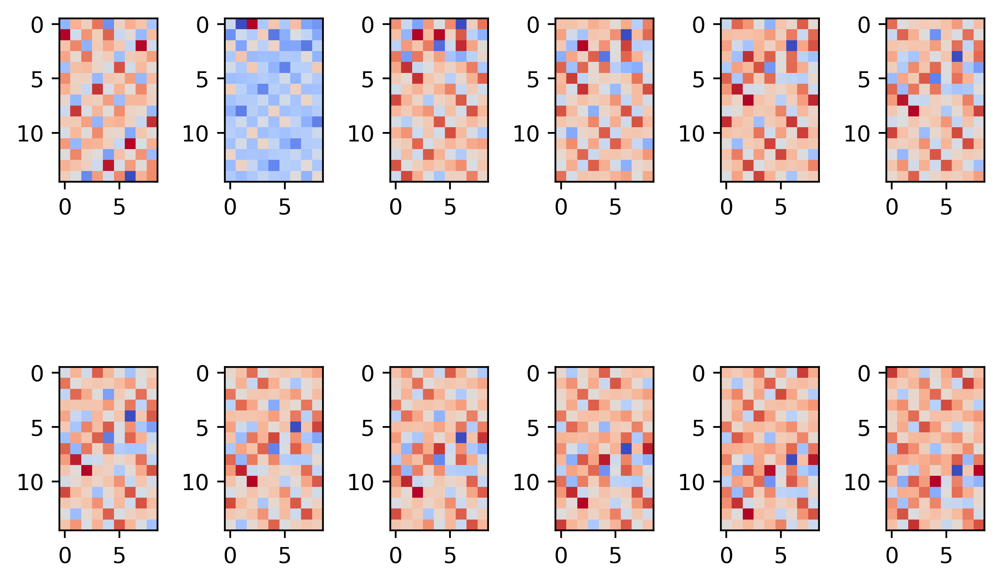

In [166]:
fig,axs = plt.subplots(2,6,dpi=500)
for i,ax in enumerate(axs.flat):
    im = ax.imshow(r[i],cmap='coolwarm')

# # axs.set_xticks(index)
#     cbar = ax.figure.colorbar(im, ax=ax)
#     cbar.ax.set_ylabel('Value', rotation=-90, va="bottom")
plt.tight_layout()
# plt.savefig('./Final_OUTPUT.jpg',bbox_inches='tight',dpi=500)

In [41]:
labelx = [i for i in range(1,86)]
labely = [i for i in range(1,14)]

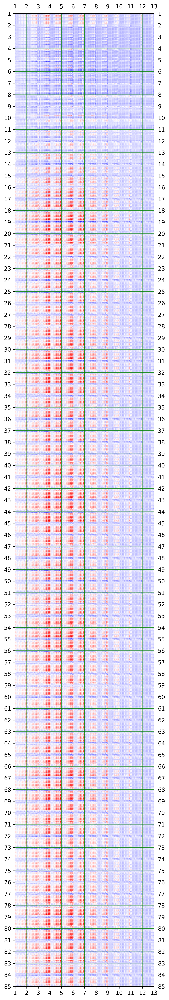

In [42]:
fig,axs = plt.subplots(1,1,figsize=(10, 25),dpi=300)
######
# 设置左侧和底部子图的刻度
axs.tick_params(axis='y', labelleft=True)
axs.tick_params(axis='x', labelbottom=True)

# 设置右侧和顶部子图的刻度
axs.tick_params(axis='y', labelright=True)
axs.tick_params(axis='x', labeltop=True)
######
im = axs.imshow(result.T,cmap='seismic')
# cbar = axs.figure.colorbar(im, ax=axs)
# cbar.ax.set_ylabel('Value', rotation=-90, va="bottom")
axs.set_xticks(index_x)
axs.set_xticklabels(labely)
axs.set_yticks(index_y)
axs.set_yticklabels(labelx)
for i in index_x:
    axs.axvline(x=i,color='green',linewidth=.4)
for i in index_y:
    axs.axhline(y=i,color='green',linewidth=.4)
plt.tight_layout()
# plt.savefig('./dot.tif',bbox_inches='tight',dpi=400)

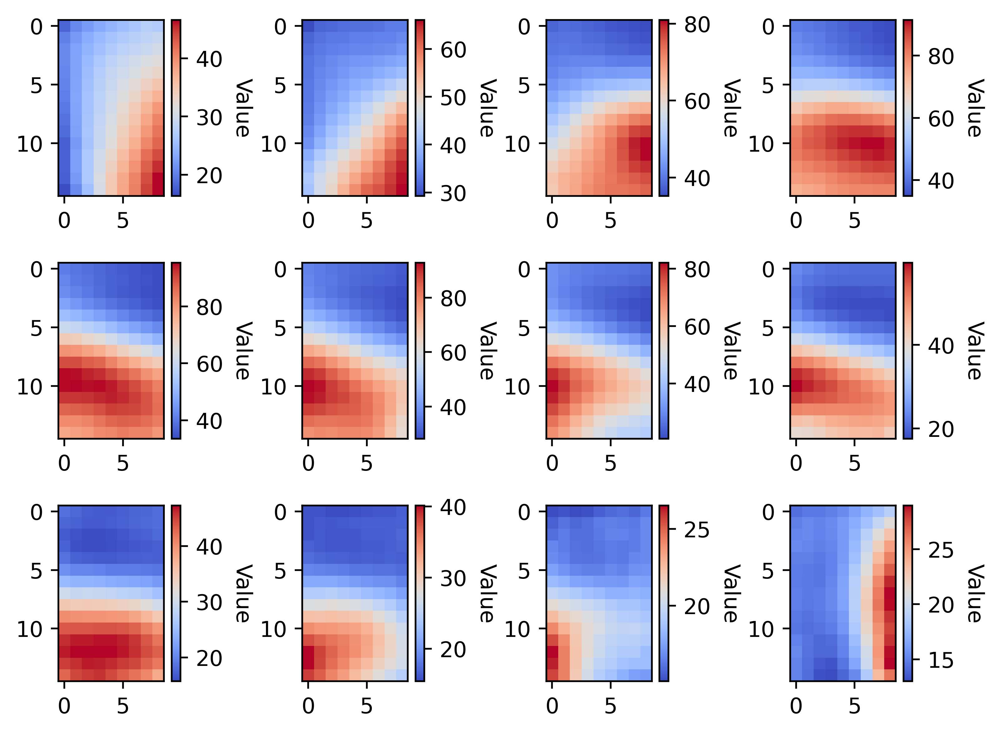

In [113]:
fig,axs = plt.subplots(3,4,dpi=500)
for i,ax in enumerate(axs.flat):
    im = ax.imshow(result_mean[i],cmap='coolwarm')

# axs.set_xticks(index)
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('Value', rotation=-90, va="bottom")
plt.tight_layout()
plt.savefig('./Final_OUTPUT.jpg',bbox_inches='tight',dpi=500)

### RMSE计算

In [20]:
predict_2015 = np.load("./TECdata/AttConvLSTM/att_conv15.npy")
predict_2019 = np.load("./TECdata/AttConvLSTM/att_conv19.npy")

In [173]:
from sklearn.metrics import mean_squared_error,r2_score

In [174]:
predict_2015.shape

(365, 12, 15, 9, 1)

In [175]:
R = test_Y_2015
R = R.reshape(-1,1)
R.shape

(591300, 1)

In [176]:
(mean_squared_error(test_Y_2015.reshape(-1,1),predict_2015.reshape(-1,1),squared=False),
mean_squared_error(test_Y_2019.reshape(-1,1), predict_2019.reshape(-1,1), squared=False))

(4.580200690988425, 1.6187241978793547)

In [177]:
MAPE(test_Y_2015,predict_2015),MAPE(test_Y_2019,predict_2019)

(<tf.Tensor: shape=(), dtype=float64, numpy=0.11591379810339196>,
 <tf.Tensor: shape=(), dtype=float64, numpy=0.09893694691856977>)

In [178]:
(r2_score(test_Y_2015.reshape(-1,1),predict_2015.reshape(-1,1)),
r2_score(test_Y_2019.reshape(-1,1), predict_2019.reshape(-1,1)))

(0.9429894268438515, 0.938399928542764)

In [183]:
ssim_loss(predict_2015, test_Y_2015)

InvalidArgumentError: cannot compute ShapeN as input #1(zero-based) was expected to be a half tensor but is a double tensor [Op:ShapeN]

In [180]:
RMSE(predict_2019, test_Y_2019)

<tf.Tensor: shape=(), dtype=float64, numpy=1.618724197879355>

### 计算预测显示的散点图

In [181]:
T,P = test_Y_2015.reshape(-1,1),predict_2015.reshape(-1,1)

(0.0, 136.8)

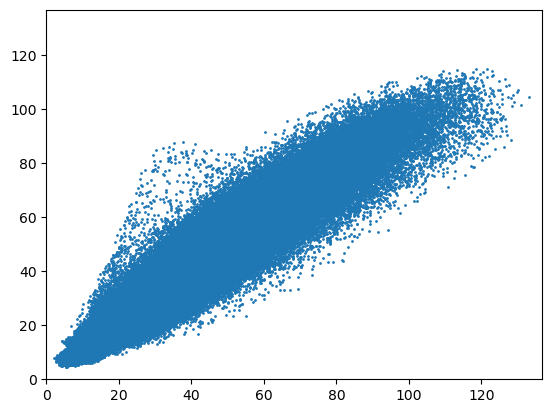

In [182]:
plt.scatter(T,P, s=1)
plt.xlim((0,MAX))
plt.ylim((0,MAX))

In [31]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(R, P)
line_x = np.linspace(0, MAX, 2)
y = reg.coef_[0][0] * line_x + reg.intercept_[0]

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.stats import gaussian_kde
from joblib import Parallel, delayed

In [38]:
R = np.squeeze(R[:])
P = np.squeeze(P[:])

In [51]:
# # 定义计算KDE的函数
# def compute_kde(xy):
#     return gaussian_kde(xy)(xy)

# # 并行计算KDE
# n_jobs = 10000
# xy = np.vstack([R, P])
# with Parallel(n_jobs=n_jobs, prefer="threads") as parallel:
#     z = np.concatenate(parallel(delayed(compute_kde)(xy[:, i::n_jobs]) for i in range(n_jobs)))

# # 绘制散点图和热力图
# fig, ax = plt.subplots(dpi=300)
# idx = z.argsort()
# r, p, z = R[idx], P[idx], z[idx]
# scatter = ax.scatter(r, p, s=1, c=z, marker='o', edgecolors='', cmap='Spectral')
# plt.xlabel('Observed TEC/TECU', fontsize=14)
# plt.ylabel('Forecast TEC/TECU', fontsize=14)
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.1)
# cbar = fig.colorbar(scatter, cax=cax, label='frequency')
# plt.show()